In [8]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


In [9]:
def get_file_list(folder_path):
    
    temp_list = os.listdir(folder_path)
    final_list = []
    for file in temp_list:
        temp = file.split('.')[-1]
        if temp == 'jpg' or temp == 'JPG'or temp == 'png':
            final_list.append(file)
            
    return final_list


def load_img(file_path):
    img = cv2.imread(file_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    return img

def plot_img(img, cmap=None):
    f, ax = plt.subplots(1, 1, figsize = (15, 10))
    if cmap is None:
        ax.imshow(img)
    else:
        ax.imshow(img, cmap)
        
def plot_two_img(img1, img2):
    f, ax = plt.subplots(1, 2, figsize = (15, 7))
    ax[0].imshow(img1)
    ax[1].imshow(img2)

In [10]:
def preprocess(img, threshold=10):
    r_ch = img[:,:,0].copy()
    g_ch = img[:,:,1].copy()
   
    diff = r_ch.astype(np.float16) - g_ch.astype(np.float16)
    ndvi = diff / (g_ch + 1E-5)
    
    #diff = img[:,:,0].astype(np.int16) - img[:,:,1].astype(np.int16)
    #diff = remove_outliers(diff)
    #diff[diff < threshold] = 0
    g_ch = reduce_outliers(g_ch, 0, 0.002)
    g = (g_ch.astype(np.float16) - g_ch.min()) / (g_ch.max() - g_ch.min()) * 255
    d = (ndvi.astype(np.float16) - ndvi.min()) / (ndvi.max() - ndvi.min()) * 255
    res = img.copy()
    res[:,:,0] = d.astype(np.uint8)
    res[:,:,1] = g.astype(np.uint8)
    
    return res

def green_c_pp(img, threshold=10):
    diff = img[:,:,0].astype(np.int16) - img[:,:,1].astype(np.int16)
    diff = remove_outliers(diff)
    diff[diff > threshold] = 0
    d = (diff.astype(np.float16) - diff.min()) / (diff.max() - diff.min()) * 255
    res = img.copy()
    res[:,:,0] = d.astype(np.uint8)
    
    return res

def remove_outliers(diff, lower_percentile = 0.05, upper_percentile = 0.0005):
    
    h, b = np.histogram(diff.flatten(), 256)
    total = np.sum(h)
    accumulated = np.cumsum(h).astype(np.float32) / total
    
    for i, h_ in enumerate(accumulated):
        if h_ >= lower_percentile:
            break
    lower_threshold = b[i]
    
    for i in range(len(accumulated) - 1, 0, -1):
        if accumulated[i] <= 1 - upper_percentile:
            break
    upper_threshold = b[i]
    
    res = diff.copy()
    res[res >= upper_threshold] = 0
    res[res <= lower_threshold] = 0
    
    return res

def reduce_outliers(diff, lower_percentile = 0.05, upper_percentile = 0.0005):
    
    m = np.mean(diff)
    h, b = np.histogram(diff.flatten(), 256)
    total = np.sum(h)
    accumulated = np.cumsum(h).astype(np.float32) / total
    
    for i, h_ in enumerate(accumulated):
        if h_ >= lower_percentile:
            break
    lower_threshold = b[i]
    
    for i in range(len(accumulated) - 1, 0, -1):
        if accumulated[i] <= 1 - upper_percentile:
            break
    upper_threshold = b[i]
    
    res = diff.copy()
    res[res >= upper_threshold] = upper_threshold
    res[res <= lower_threshold] = 0
    
    return res

def calculate_2dft(input):
    ft = np.fft.ifftshift(input)
    ft = np.fft.fft2(ft)
    return np.fft.fftshift(ft)
        
        

In [11]:
folder_path = r'C:\Users\Matan\Documents\Projects\Data\JAI preprocess'
file_list = get_file_list(folder_path)
len(file_list)

56

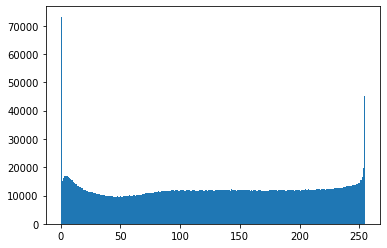

In [12]:
#for file in file_list:
file = file_list[5]
img = load_img(os.path.join(folder_path, file))
#res = preprocess(img, 0)
#plot_two_img(img, res)
_ = plt.hist(img[:,:,0].flatten(),256)

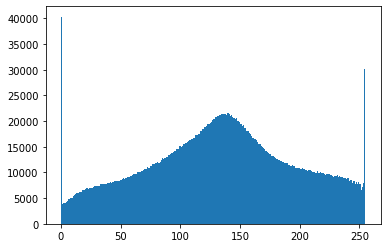

In [8]:
h = plt.hist(img[:,:,2].flatten(), 256) 

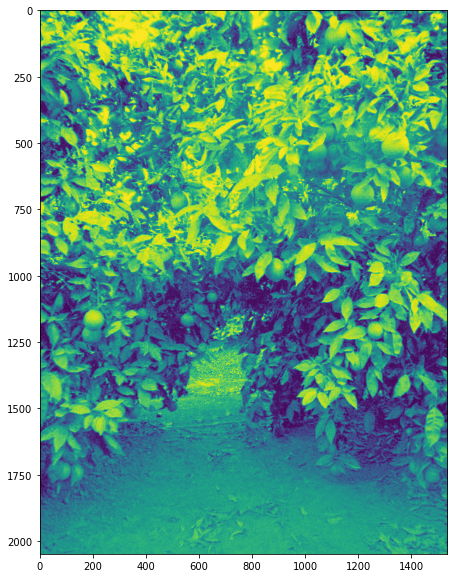

In [9]:
plot_img(img[:,:,2])

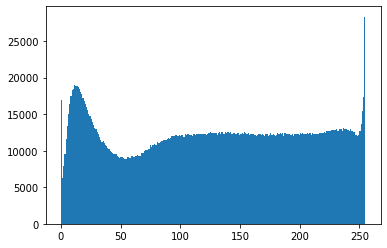

In [10]:
h = plt.hist(img[:,:,1].flatten(), 256)

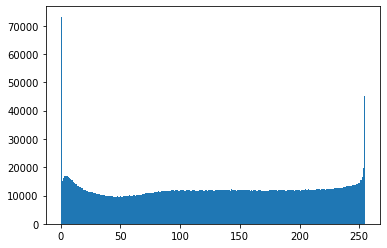

In [11]:
h = plt.hist(img[:,:,0].flatten(), 256)

In [12]:
threshold = 0
diff = img[:,:,0].astype(np.int16) - img[:,:,1].astype(np.int16)
diff = remove_outliers(diff)
diff_min = diff.min()

tf1 = np.where(diff < threshold, True, False)
#tf2 = np.where(diff > -threshold, True, False)
#tf = tf1 & tf2
diff[tf1] = diff_min

#noise_thr = 35
#diff[diff > noise_thr ] = 0 
d = (diff.astype(np.float16) - diff.min()) / (diff.max() - diff.min()) * 255
res = img.copy()
res[:,:,0] = d.astype(np.uint8)

In [116]:
diff = img[:,:,0].astype(np.int16) - img[:,:,1].astype(np.int16)

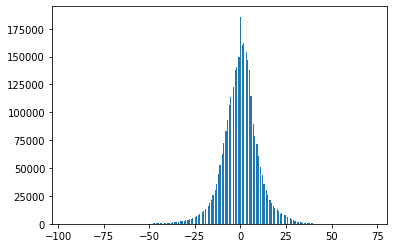

In [40]:
#diff = img[:,:,0].astype(np.int16) - img[:,:,1].astype(np.int16)
#diff = remove_outliers(diff)
h = plt.hist(diff.flatten(), 256)

In [108]:
threshold = 10
diff_min = diff.min()
m = np.mean(diff)
s = np.std(diff)

tf1 = np.where(diff < m + s, True, False)
#tf2 = np.where(diff > -threshold, True, False)
#tf = tf1 & tf2
diff[tf1] = 0 #diff_min


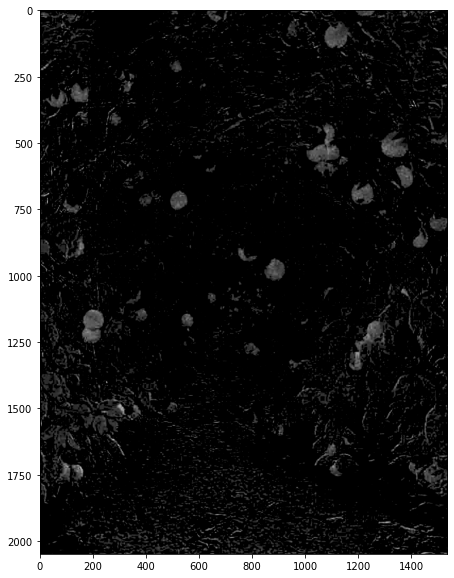

In [95]:
plot_img(diff, 'gray')

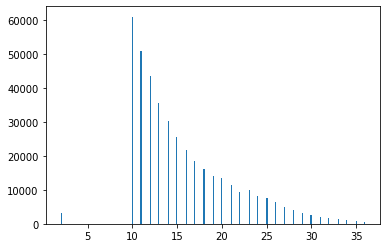

In [87]:
#dd = reduce_outliers(diff,0, 0.001)
h = plt.hist(dd[dd > 0].flatten(), 256)


In [109]:
dd = diff
d = (dd.astype(np.float16) - dd.min()) / (dd.max() - dd.min()) #* 255
#d = (d * (220-35)) + 35

In [99]:
exp_d = np.exp(d)
exp_d = exp_d / np.max(exp_d)

In [110]:
sq_d = np.sqrt(d)
sq_d = sq_d / np.max(sq_d)

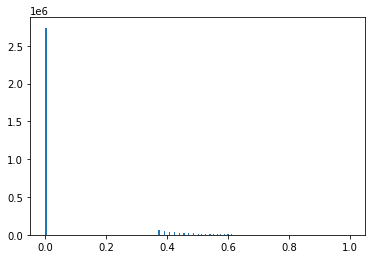

In [112]:
h = plt.hist(sq_d.flatten(), 256)

In [101]:
nd = exp_d * 255

In [113]:
nd = sq_d * 255

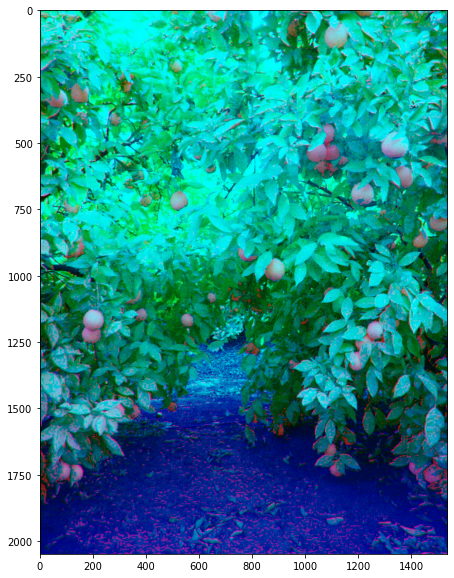

In [115]:
res = img.copy()
res[:,:,0] = nd.astype(np.uint8)
plot_img(res)

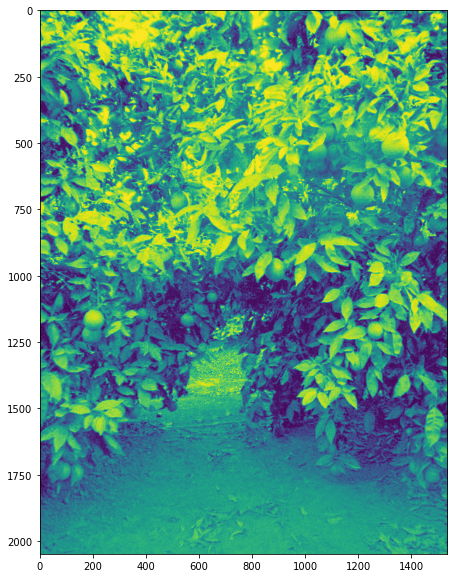

In [106]:
plot_img(img[:,:,2])

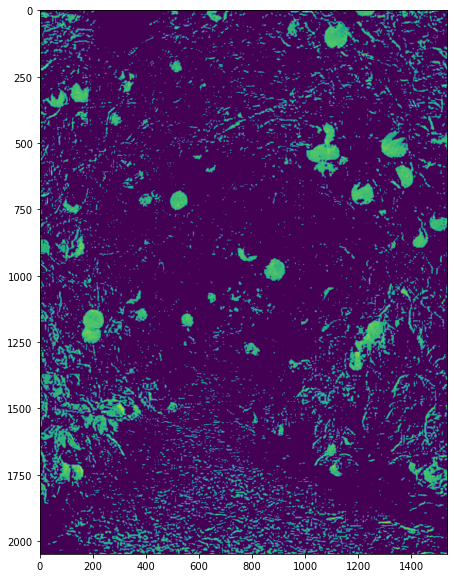

In [30]:
plot_img(d)

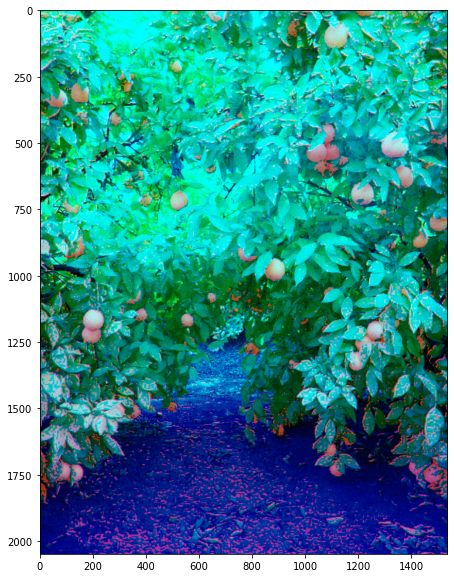

In [38]:
res = img.copy()
red = res[:,:,0].copy()
res[:,:,0] = d.astype(np.uint8)
res[:,:,1] = red
plot_img(res)

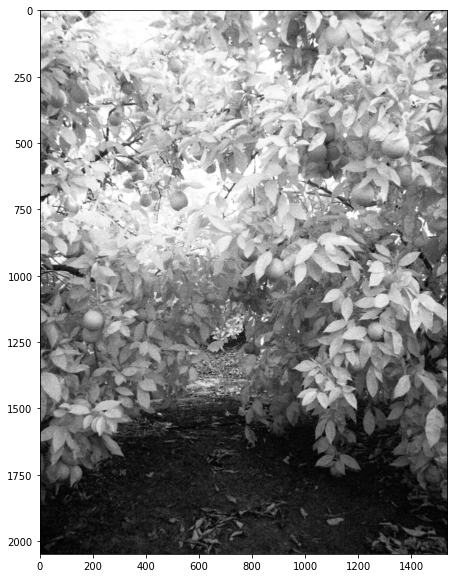

In [37]:
plot_img(img[:,:,1], 'gray')

In [144]:
ndvi = diff / (img[:,:,1] + 1E-5)

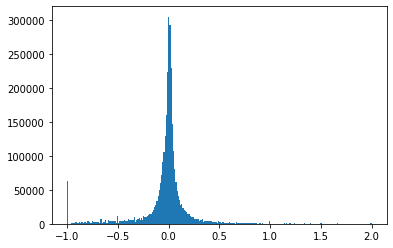

In [135]:
h = plt.hist(ndvi.flatten(),256)

In [145]:
t1 = ndvi > 2
ndvi[t1] = 0

In [146]:
t1 = ndvi < -2
ndvi[t1] = 0

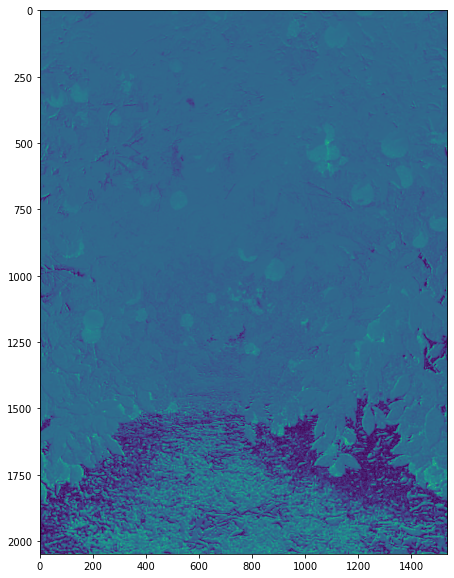

In [147]:
plot_img(ndvi)

In [161]:
vi = ndvi.copy()
m = np.mean(ndvi)
s = np.std(ndvi)
t1 = vi > m + 2 * s
vi[t1] = 0
vi[vi < m] = 0

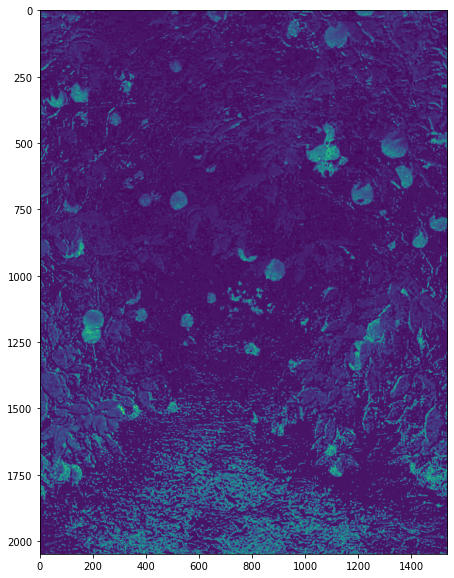

In [162]:
plot_img(vi)

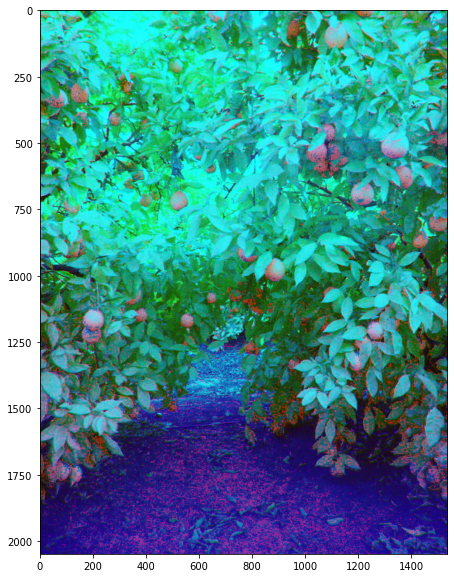

In [160]:
dd = vi
d = (dd.astype(np.float16) - dd.min()) / (dd.max() - dd.min()) * 255
res = img.copy()
res[:,:,0] = d.astype(np.uint8)
plot_img(res)

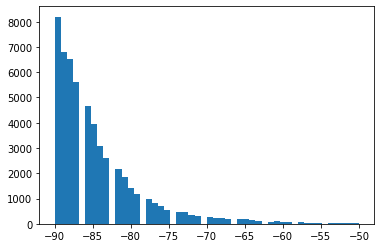

In [73]:
from scipy.stats import halfnorm
vec = diff[diff > -10].flatten()


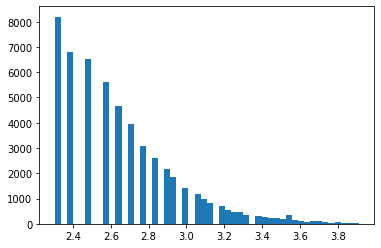

In [74]:
ld = np.log(diff[diff>-10].flatten())
h = plt.hist(ld, 50)

In [50]:
m = diff.mean()
s = diff.std()

s

12.187874423770849

In [51]:
m

-0.7288074493408203

In [44]:
r = img[:,:,0].copy()

In [45]:
g = img[:,:,1].copy()

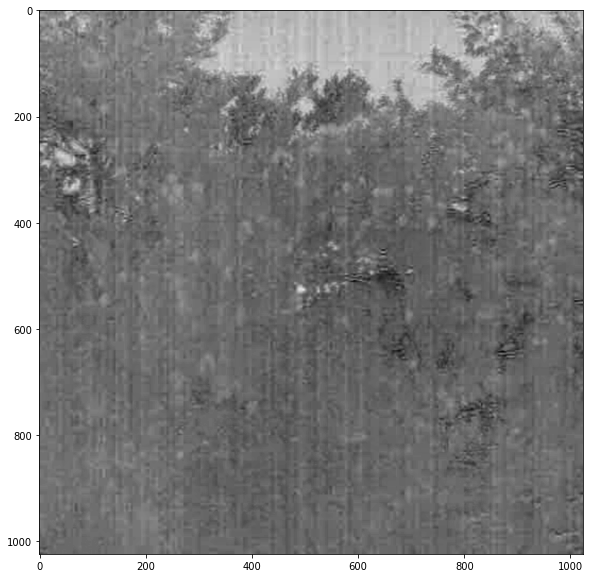

In [57]:
d = r.astype(np.float16) - g.astype(np.float16)
plot_img(d, 'gray')

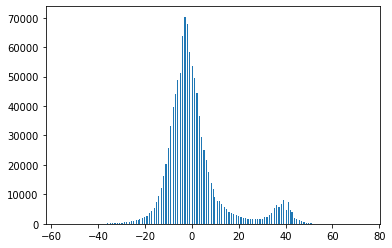

In [47]:
h = plt.hist(d.flatten(), 256)

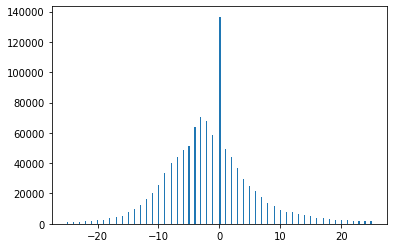

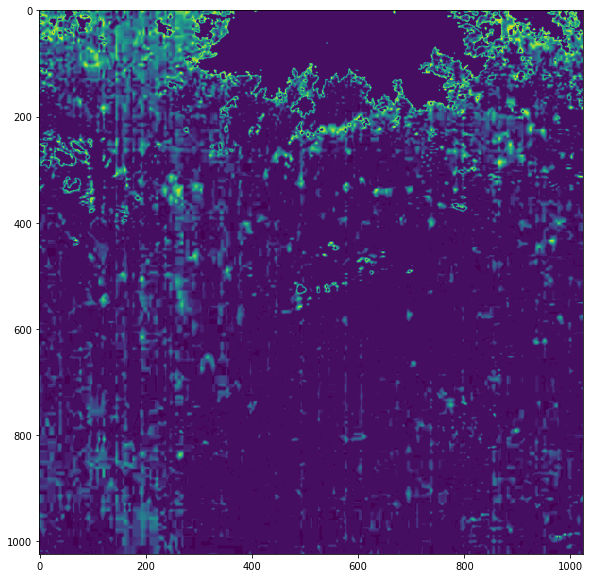

In [61]:
tf1 = d > 25
tf2 = d < -25
tf = np.logical_or(tf1, tf2)
d[tf] = 0
flatten = d[np.logical_not(tf)].flatten()
h = plt.hist(flatten,256)
m = np.mean(flatten)
s = np.std(flatten)
t = d.copy()
t[d < m] = 0
t = (t.astype(np.float16) - t.min()) / (t.max() - t.min()) * 255
plot_img(t)

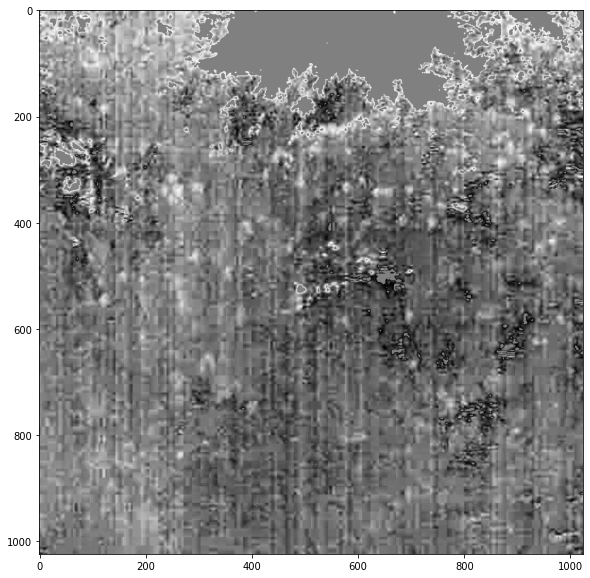

In [60]:
plot_img(d, 'gray')

In [18]:
res = img.copy()

In [19]:
d = (d.astype(np.float16) - d.min()) / (d.max() - d.min()) * 255

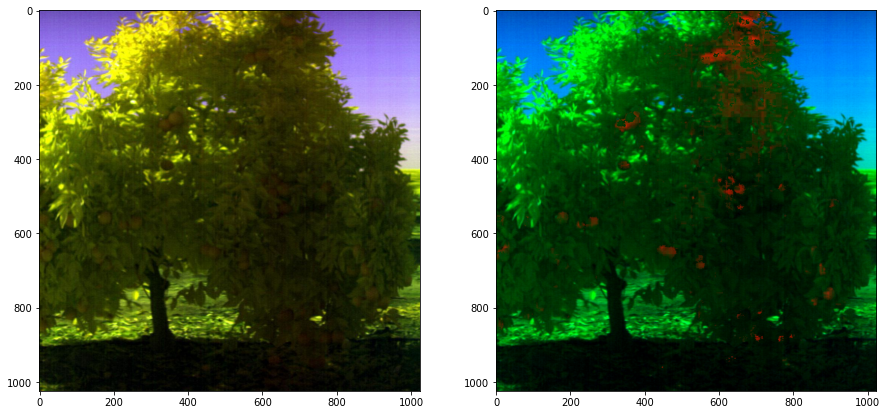

In [20]:
res[:,:,0] = d.copy()
plot_two_img(img, res)

In [412]:
fp = r'C:\Users\Matan\Documents\Projects\Data\Slicer\from Roi\RA_3_A_2\RA_3_A_2'
#fp = r'C:\Users\Matan\Documents\Projects\Data\Slicer\from Roi\15_20_A_16\15_20_A_16'#, f_id = 318
#fp = r'C:\Users\Matan\Documents\Projects\Data\Slicer\from Roi\RA_3_A_10\RA_3_A_10' # f_id = 567, 579
f_id = 183
orig = f'FSI_{f_id}.png'
rgb_n = f'Stream0_{f_id}.tiff'
r_ch_n = f'Stream1_{f_id}.tiff'
g_ch_n = f'Stream2_{f_id}.tiff'
orig = load_img(os.path.join(fp,orig))
rgb = cv2.imread(os.path.join(fp,rgb_n))
rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
r_ch = cv2.imread(os.path.join(fp,r_ch_n))
r_ch = cv2.cvtColor(r_ch, cv2.COLOR_BGR2GRAY)
g_ch = cv2.imread(os.path.join(fp,g_ch_n))
g_ch = cv2.cvtColor(g_ch, cv2.COLOR_BGR2GRAY)

In [79]:
fp = r'C:\Users\Matan\Documents\Projects\Data\wetransfer_jai_samples_2022-08-11_0745\JAI_Samples\S4'
r_ch = np.array(Image.open(os.path.join(fp,'Stream1_1089.tiff')))

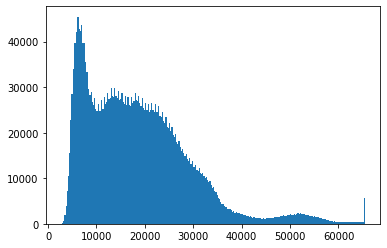

In [3]:
b = np.max(r_ch)
h = plt.hist(r_ch.flatten(), 256)

In [470]:
b

65520

In [80]:
#fp = r'C:\Users\Matan\Documents\Projects\Data\wetransfer_jai_samples_2022-08-11_0745\JAI_Samples\S1'
fp = r'C:\Users\Matan\Documents\Projects\Data\wetransfer_jai_samples_2022-08-11_0745\JAI_Samples\S4'
rgb = np.array(Image.open(os.path.join(fp,'Stream0_1089.tiff')))
g_ch = np.array(Image.open(os.path.join(fp,'Stream2_1089.tiff')))

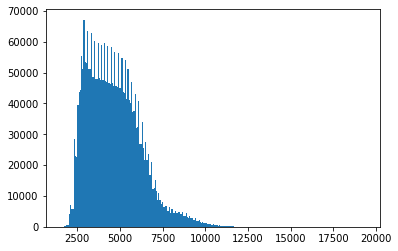

In [5]:
b = np.max(g_ch)
h = plt.hist(g_ch.flatten(), 256)

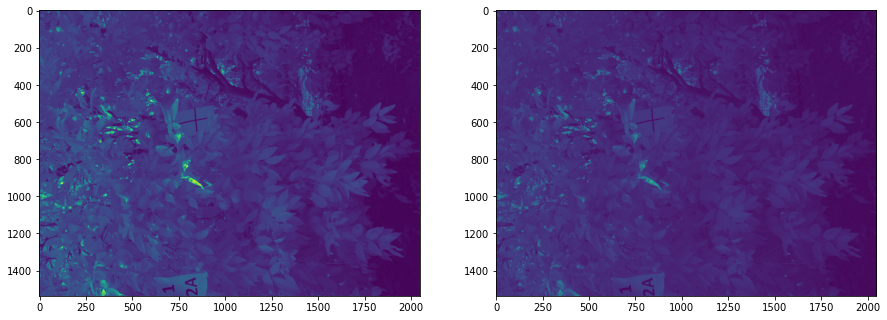

In [430]:
plot_two_img(r_ch, g_ch)

In [81]:
gain = r_ch.max() - r_ch.min()
r_ch = r_ch.astype(np.float32) - r_ch.min()
g_ch = (g_ch.astype(np.float32) - g_ch.min()) / (g_ch.max() - g_ch.min()) * gain
diff = (r_ch.astype(np.float32)) - (g_ch.astype(np.float32))
ndri = diff.astype(np.float32) / (g_ch.astype(np.float32) + 1) 

In [47]:
g_ch = reduce_outliers(g_ch, 0, 0.002)
ndri = reduce_outliers(g_ch, 0.002, 0.002)

In [66]:
d = ndri.copy()
d = (d.astype(np.float32) - d.min()) / (d.max() - d.min()) * 255
g = (g_ch.astype(np.float32) - g_ch.min()) / (g_ch.max() - g_ch.min()) * 255
res = rgb.copy()
res[:,:,0] = d.astype(np.uint8)
res[:,:,1] = g.astype(np.uint8)

In [15]:
d = r_ch.copy()
d = (d.astype(np.float32) - d.min()) / (d.max() - d.min()) * 255

In [77]:
ndri = diff / g_ch

C:\Users\Matan\AppData\Local\Temp\ipykernel_3860\3012592639.py:1: RuntimeWarning: divide by zero encountered in divide
  ndri = diff / g_ch


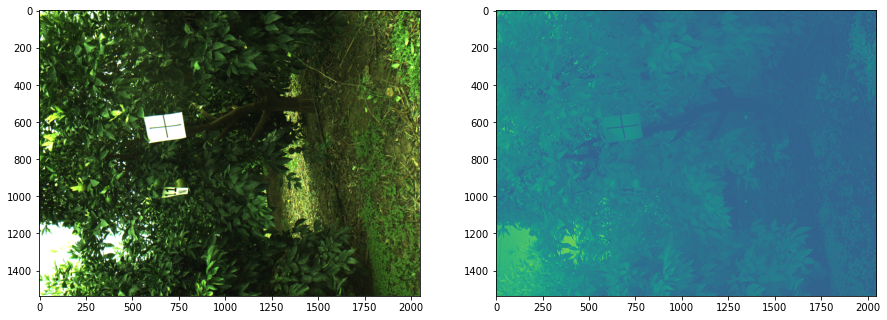

In [83]:
plot_two_img(rgb, diff)

In [24]:
ndri = diff / g_ch

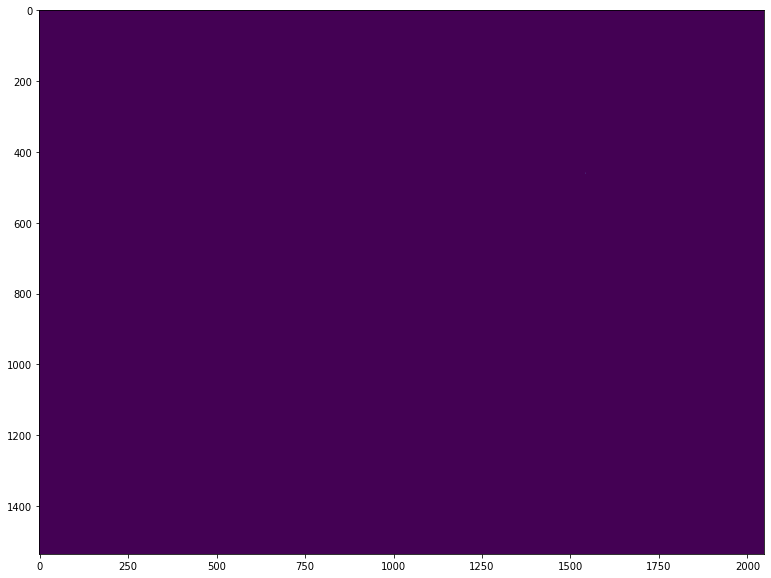

In [70]:
#g = d.copy()
plot_img(ndri)

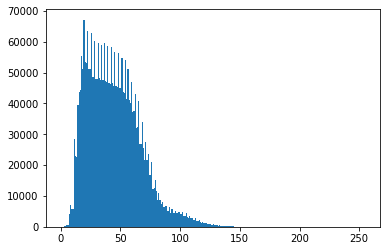

In [31]:
h = plt.hist(g.flatten(), 256)

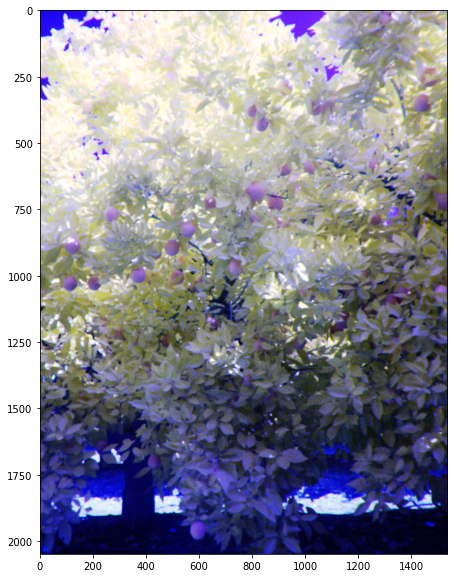

In [380]:
plot_img(orig)

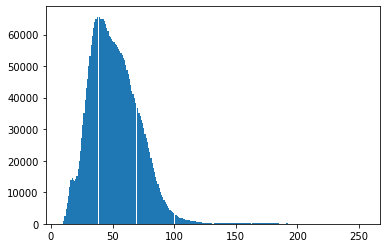

In [273]:
b = np.max(g_ch)
h = plt.hist(g_ch.flatten(), b)

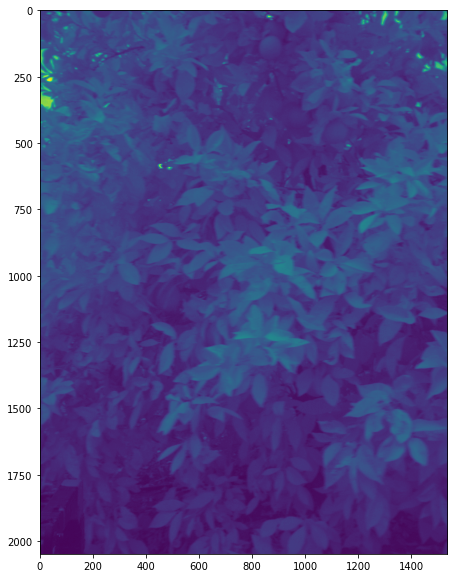

In [274]:
plot_img(g_ch)

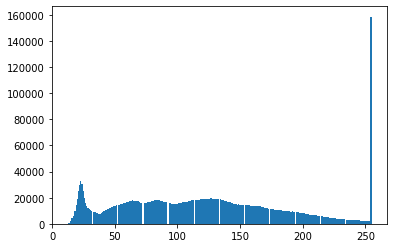

In [419]:
b = np.max(r_ch)
h = plt.hist(r_ch.flatten(), b)

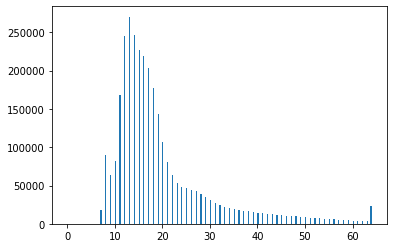

In [362]:
h = plt.hist(g_o.flatten(), 256)

In [299]:
tot = np.sum(h[0])
per = np.cumsum(h[0]) / tot


array([2.86102295e-06, 3.27428182e-05, 2.71161397e-04, 1.07796987e-03,
       2.54599253e-03, 4.59194183e-03, 7.37635295e-03, 1.10750198e-02,
       1.55092875e-02, 2.01012293e-02, 2.45599747e-02, 2.89080938e-02,
       3.34574382e-02, 3.83179983e-02, 4.38019435e-02, 5.01375198e-02,
       5.74254990e-02, 6.60915375e-02, 7.60008494e-02, 8.71655146e-02,
       9.95947520e-02, 1.13245646e-01, 1.27873421e-01, 1.43804232e-01,
       1.60713832e-01, 1.78728422e-01, 1.97661718e-01, 2.17439334e-01,
       2.17439334e-01, 2.37818082e-01, 2.58461634e-01, 2.79329936e-01,
       3.00168037e-01, 3.20833206e-01, 3.41492971e-01, 3.62111410e-01,
       3.82594109e-01, 4.02747154e-01, 4.22443072e-01, 4.41877047e-01,
       4.60818926e-01, 4.79660988e-01, 4.98268127e-01, 5.16658465e-01,
       5.34989039e-01, 5.53132693e-01, 5.71176847e-01, 5.88961283e-01,
       6.06620153e-01, 6.24050458e-01, 6.41290029e-01, 6.58260663e-01,
       6.74966812e-01, 6.91452026e-01, 7.07495689e-01, 7.22997348e-01,
      

In [302]:
per[150]

0.9976676305135092

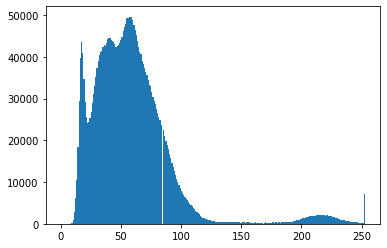

In [418]:
g_o = reduce_outliers(g_ch, 0, 0.002)
_ = plt.hist(g_o.flatten(),256)

In [281]:
diff = r_ch.astype(np.float16) - g_ch.astype(np.float16)
ndvi = diff / (g_ch + 1E-5)


In [288]:
g_ch[g_ch > 175] = 175

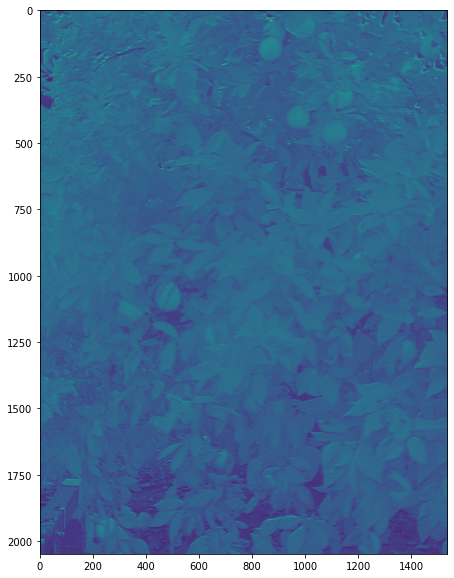

In [282]:
plot_img(ndvi)

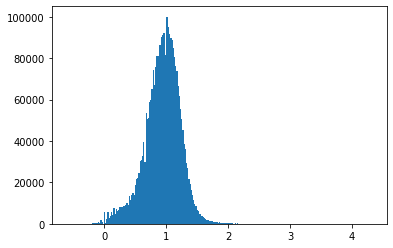

In [283]:
h = plt.hist(ndvi.flatten(), 256)

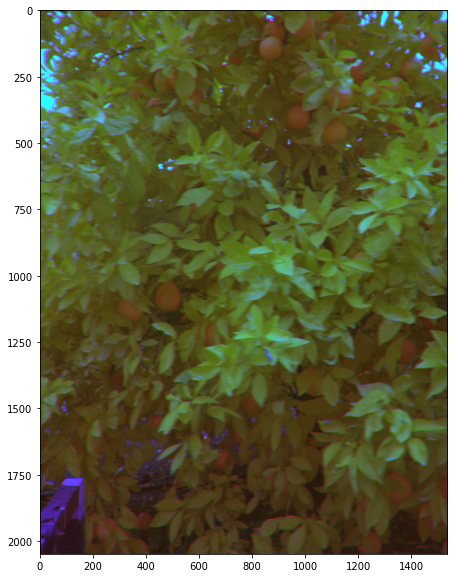

In [314]:
d = ndvi.copy()
d = (d.astype(np.float16) - d.min()) / (d.max() - d.min()) * 255
#g = (g_ch.astype(np.float16) - g_ch.min()) / (g_ch.max() - g_ch.min()) * 255
g = (g_o.astype(np.float16) - g_o.min()) / (g_o.max() - g_o.min()) * 255
res = rgb.copy()
res[:,:,0] = d.astype(np.uint8)
res[:,:,1] = g.astype(np.uint8)

#plot_img(res)

In [315]:
g = (g_ch.astype(np.float16) - g_ch.min()) / (g_ch.max() - g_ch.min()) * 255
res1 = rgb.copy()
res1[:,:,0] = d.astype(np.uint8)
res1[:,:,1] = g.astype(np.uint8)

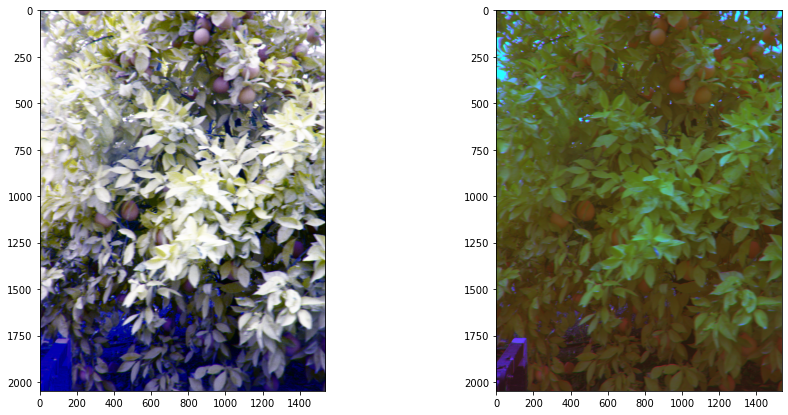

In [317]:
plot_two_img(orig, res)

In [211]:
lab_o = cv2.cvtColor(orig, cv2.COLOR_RGB2LAB)
lab_r = cv2.cvtColor(res, cv2.COLOR_RGB2LAB)

In [212]:
hsv.shape

(2048, 1536, 3)

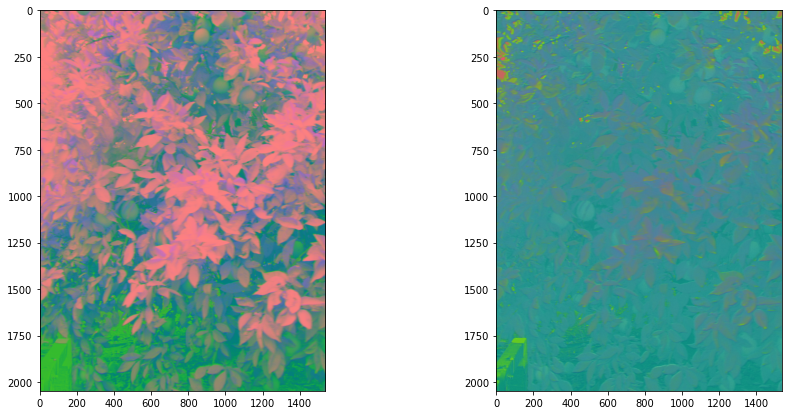

In [213]:
plot_two_img(lab_o, lab_r)

In [237]:
hsv_o = cv2.cvtColor(orig, cv2.COLOR_RGB2HSV)
hsv_r = cv2.cvtColor(res, cv2.COLOR_RGB2HSV)

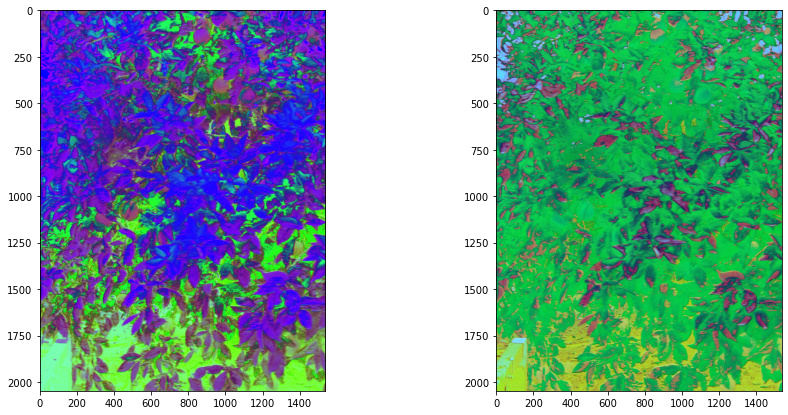

In [238]:
plot_two_img(hsv_o, hsv_r)

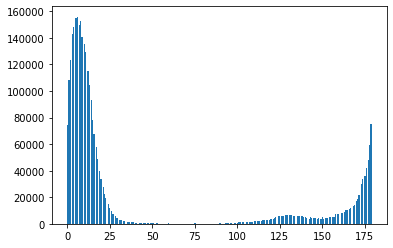

In [246]:
h = hsv_r[:,:,0].copy()
_ = plt.hist(h.flatten(), 256)

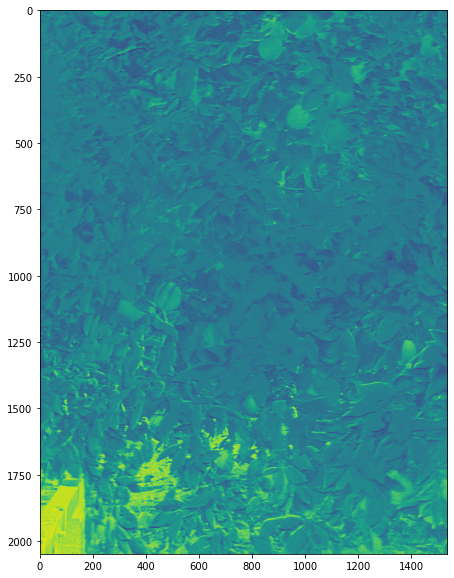

In [256]:
plot_img(lab_o[:,:,1])

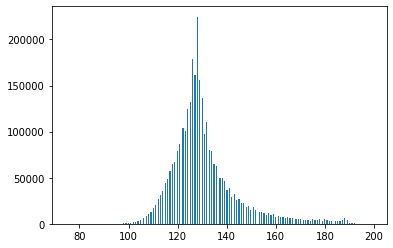

In [260]:
h = lab_o[:,:,1].copy()
_ = plt.hist(h.flatten(), 256)

In [261]:
h[h<140] = 0
h[h>180] = 0

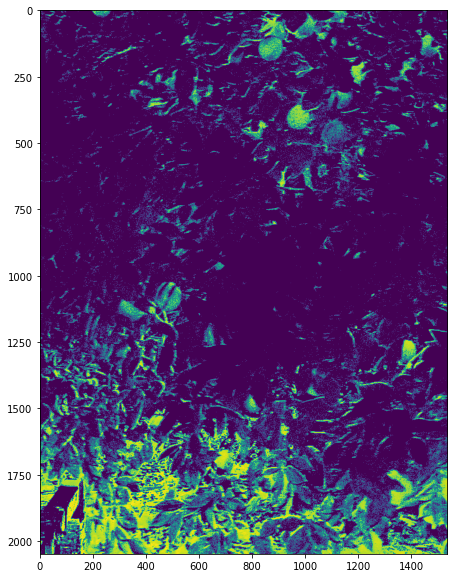

In [262]:
plot_img(h)